In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
from glob import glob
import seaborn as sns

In [2]:
base_skin_dir = "OneDrive/Desktop/skin dataset"
skin_df = pd.read_csv(os.path.join(base_skin_dir, 'HAM10000_metadata.csv')) # load in the data
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [3]:
lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

In [4]:
skin_df['path'] = 'OneDrive/Desktop/skin dataset/images/'+skin_df['image_id']+'.jpg'
skin_df['cell_type'] = skin_df['dx'].map(lesion_type_dict.get) 
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,OneDrive/Desktop/skin dataset/images/ISIC_0027...,Benign keratosis-like lesions
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,OneDrive/Desktop/skin dataset/images/ISIC_0025...,Benign keratosis-like lesions
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,OneDrive/Desktop/skin dataset/images/ISIC_0026...,Benign keratosis-like lesions
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,OneDrive/Desktop/skin dataset/images/ISIC_0025...,Benign keratosis-like lesions
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,OneDrive/Desktop/skin dataset/images/ISIC_0031...,Benign keratosis-like lesions


In [5]:
lesion_danger = {
    'nv': 0, # 0 for benign
    'mel': 1, # 1 for malignant
    'bkl': 0, # 0 for benign
    'bcc': 1, # 1 for malignant
    'akiec': 1, # 1 for malignant
    'vasc': 0,
    'df': 0
}

In [6]:
skin_df["Malignant"] = skin_df["dx"].map(lesion_danger.get)
skin_df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,Malignant
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,OneDrive/Desktop/skin dataset/images/ISIC_0027...,Benign keratosis-like lesions,0
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,OneDrive/Desktop/skin dataset/images/ISIC_0025...,Benign keratosis-like lesions,0
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,OneDrive/Desktop/skin dataset/images/ISIC_0026...,Benign keratosis-like lesions,0
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,OneDrive/Desktop/skin dataset/images/ISIC_0025...,Benign keratosis-like lesions,0
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,OneDrive/Desktop/skin dataset/images/ISIC_0031...,Benign keratosis-like lesions,0


In [7]:
skin_df["cell_type_idx"] = pd.Categorical(skin_df["cell_type"]).codes # give each cell type a category id
skin_df.sample(3)

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,Malignant,cell_type_idx
5132,HAM_0006561,ISIC_0026612,nv,follow_up,45.0,female,foot,OneDrive/Desktop/skin dataset/images/ISIC_0026...,Melanocytic nevi,0,4
7169,HAM_0000304,ISIC_0033316,nv,histo,45.0,female,abdomen,OneDrive/Desktop/skin dataset/images/ISIC_0033...,Melanocytic nevi,0,4
5514,HAM_0001184,ISIC_0028330,nv,follow_up,55.0,male,trunk,OneDrive/Desktop/skin dataset/images/ISIC_0028...,Melanocytic nevi,0,4


<AxesSubplot:title={'center':'Benign vs Malignant'}>

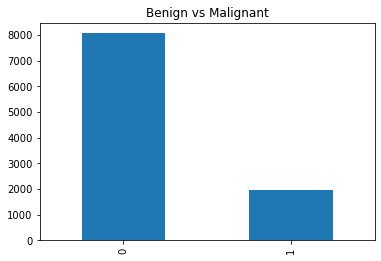

In [8]:
skin_df["Malignant"].value_counts().plot(kind="bar", title="Benign vs Malignant")

<AxesSubplot:title={'center':'Counts for each type of Lesions'}>

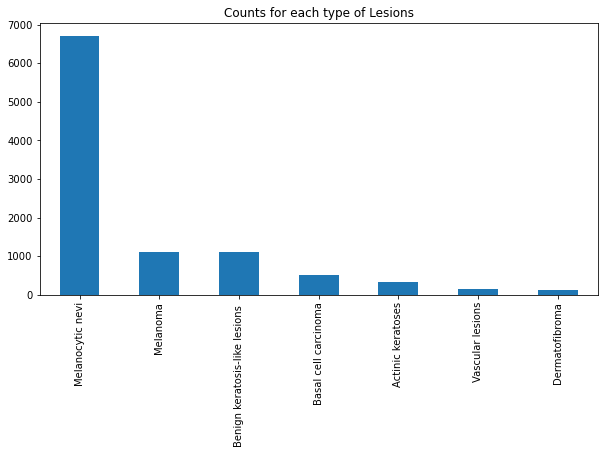

In [9]:
fig, ax1 = plt.subplots(1,1,figsize=(10,5))
skin_df["cell_type"].value_counts().plot(kind="bar", ax=ax1, title="Counts for each type of Lesions")

<AxesSubplot:title={'center':'Location of Lesions'}>

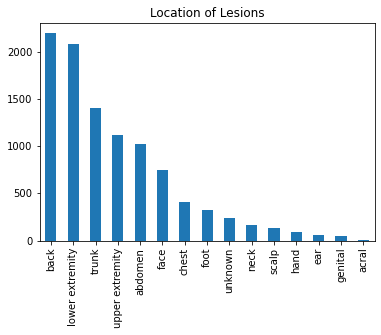

In [10]:
skin_df["localization"].value_counts().plot(kind='bar', title="Location of Lesions")

<AxesSubplot:title={'center':'Treatment received'}>

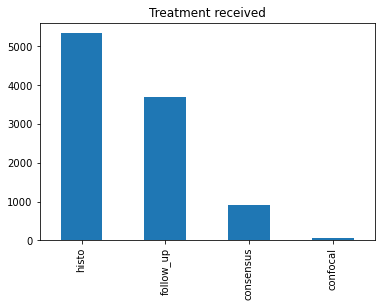

In [11]:
skin_df["dx_type"].value_counts().plot(kind='bar', title="Treatment received")

In [12]:
from skimage.io import imread
skin_df["image"] = skin_df["path"].map(imread) # read the image to array values
skin_df.iloc[0]["image"] # here is a sample

array([[[188, 147, 191],
        [186, 148, 189],
        [187, 150, 191],
        ...,
        [196, 155, 171],
        [197, 156, 170],
        [197, 157, 168]],

       [[186, 149, 193],
        [187, 152, 194],
        [189, 153, 191],
        ...,
        [194, 156, 169],
        [195, 159, 169],
        [192, 159, 168]],

       [[185, 148, 192],
        [189, 152, 195],
        [190, 153, 196],
        ...,
        [196, 155, 169],
        [198, 157, 171],
        [194, 156, 169]],

       ...,

       [[157, 124, 155],
        [156, 121, 154],
        [159, 124, 154],
        ...,
        [177, 146, 161],
        [176, 144, 159],
        [175, 141, 155]],

       [[155, 122, 151],
        [156, 123, 154],
        [156, 123, 152],
        ...,
        [178, 147, 163],
        [175, 144, 159],
        [175, 142, 159]],

       [[154, 119, 151],
        [153, 120, 149],
        [154, 121, 152],
        ...,
        [176, 147, 167],
        [175, 147, 161],
        [173, 143, 155]]

In [13]:
skin_df["image"].map(lambda x: x.shape).value_counts() 

(450, 600, 3)    10015
Name: image, dtype: int64

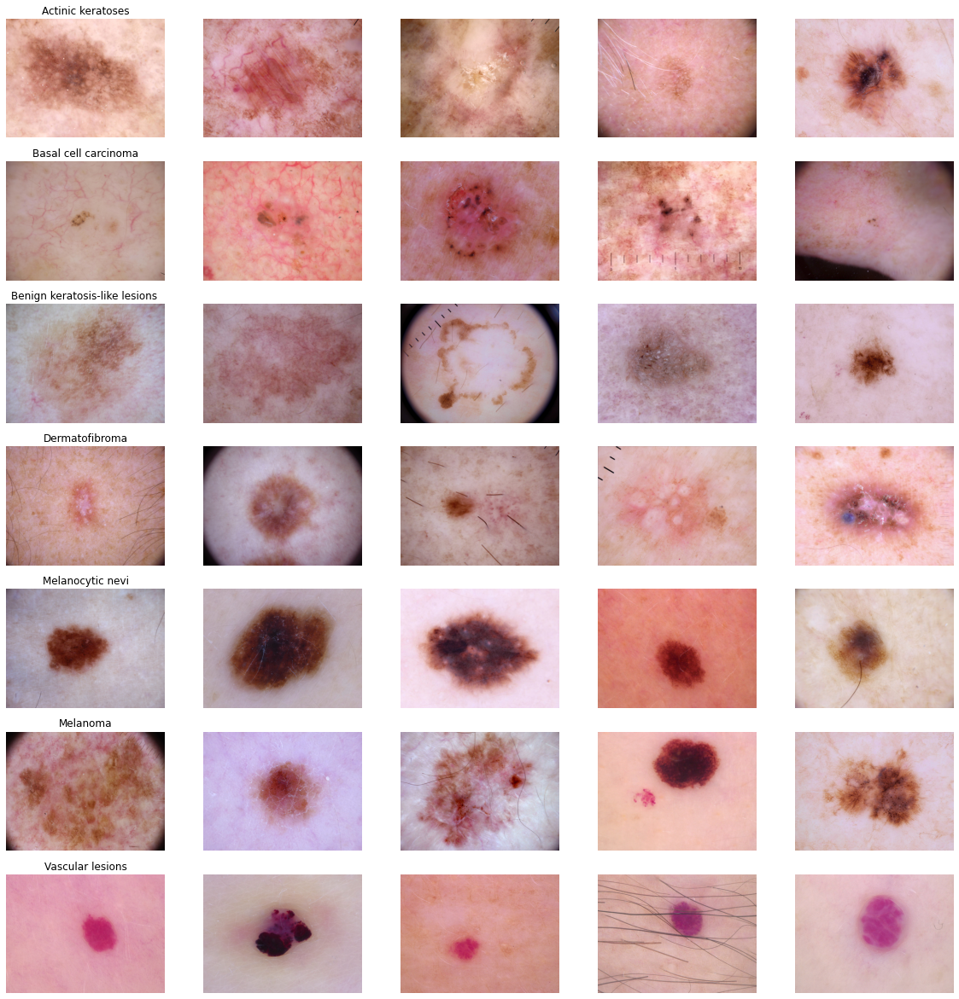

In [14]:
n_samples = 5 # choose 5 samples for each cell type
fig, m_axs = plt.subplots(7, n_samples, figsize=(4*n_samples, 3 * 7))

for n_axs, (type_name, type_rows) in zip(m_axs, skin_df.sort_values(["cell_type"]).groupby("cell_type")):
    n_axs[0].set_title(type_name)
    for c_ax, (_, c_row) in zip(n_axs, type_rows.sample(n_samples, random_state=0).iterrows()):
        c_ax.imshow(c_row["image"])
        c_ax.axis("off")

In [15]:
rgb_info_df = skin_df.apply(lambda x: pd.Series({'{}_mean'.format(k): v for k, v 
                                                 in zip(["Red", "Blue", "Green"], 
                                                        np.mean(x["image"], (0, 1)))}), 1)


gray_col_vec = rgb_info_df.apply(lambda x: np.mean(x), 1) # take the mean value across columns of rgb_info_df
for c_col in rgb_info_df.columns:
    rgb_info_df[c_col] = rgb_info_df[c_col]/gray_col_vec 
rgb_info_df["Gray_mean"] = gray_col_vec
rgb_info_df.sample(3)

,Red_mean,Blue_mean,Green_mean,Gray_mean
6191,1.375594,0.799455,0.824950,147.710943
221,1.198850,0.880955,0.920195,128.128554
6967,1.141568,0.943714,0.914718,141.347849


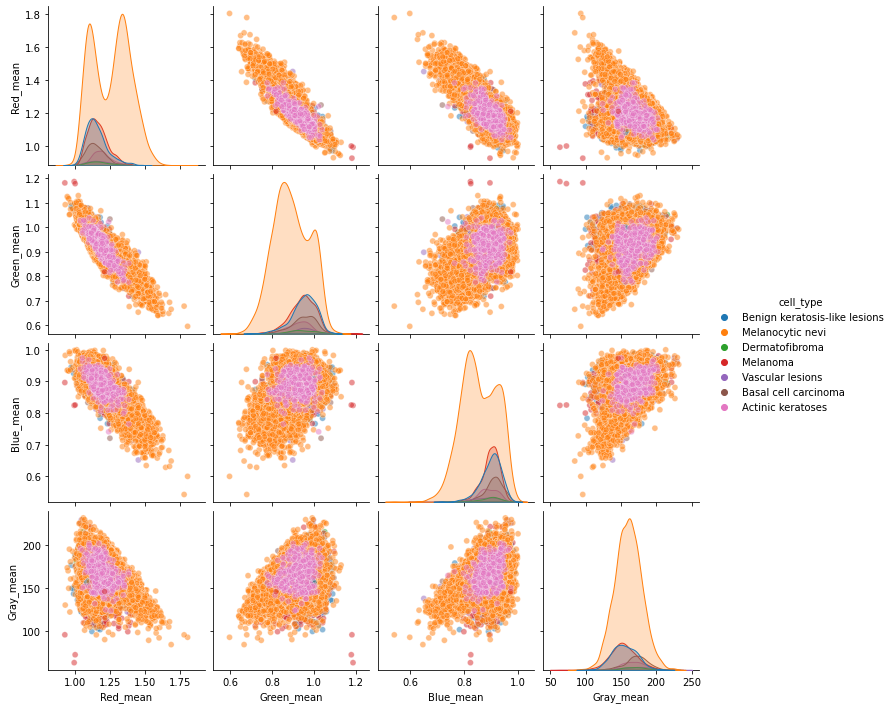

In [16]:
for c_col in rgb_info_df.columns:
    skin_df[c_col] = rgb_info_df[c_col].values
# let's draw a plot showing the distribution of different cell types over colors!
sns.pairplot(skin_df[["Red_mean", "Green_mean", "Blue_mean", "Gray_mean", "cell_type"]], 
             hue="cell_type", plot_kws = {"alpha": 0.5})

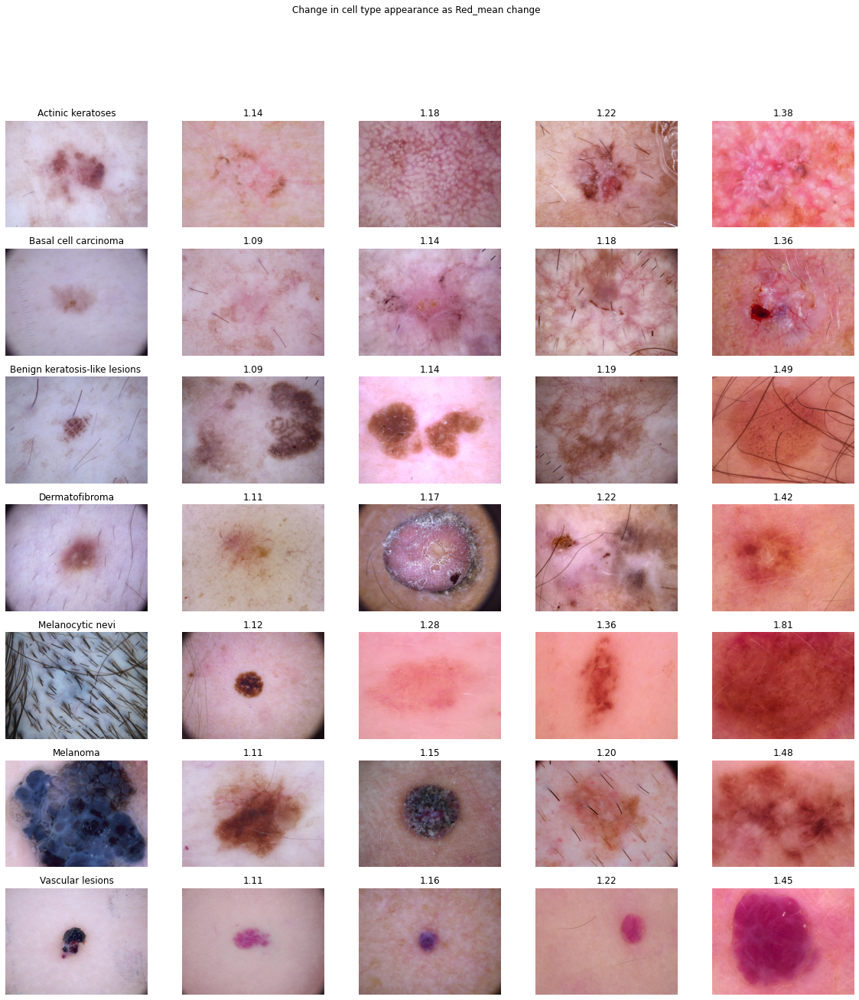

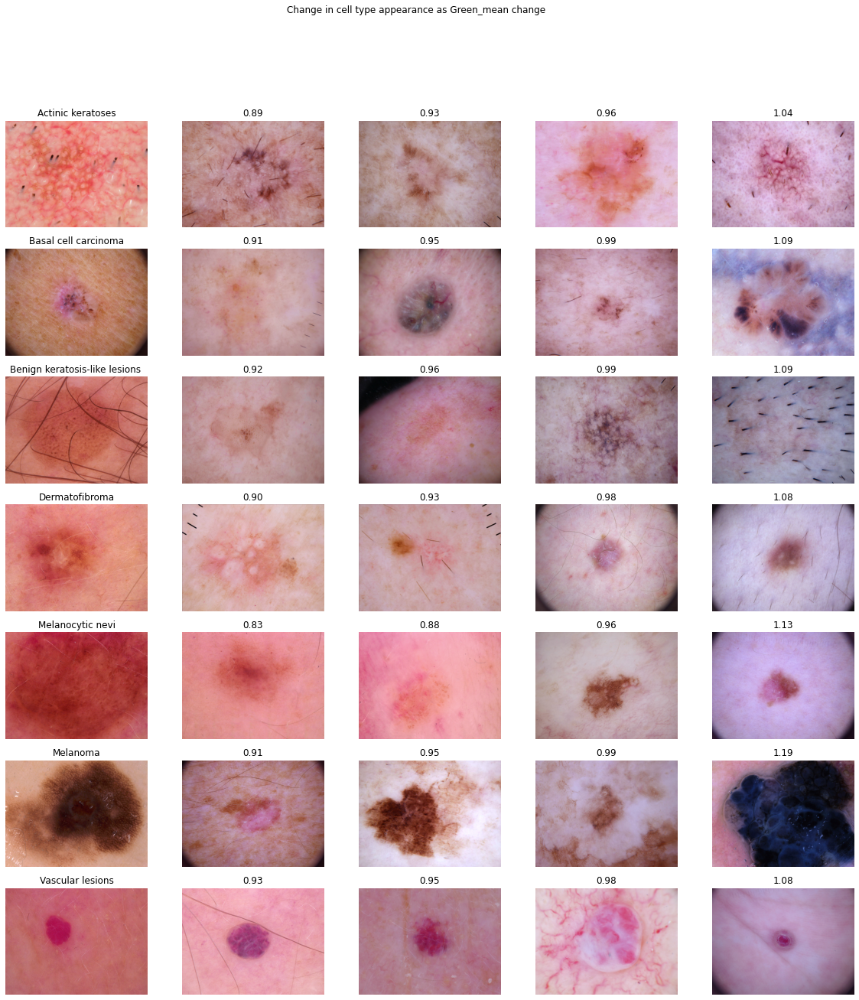

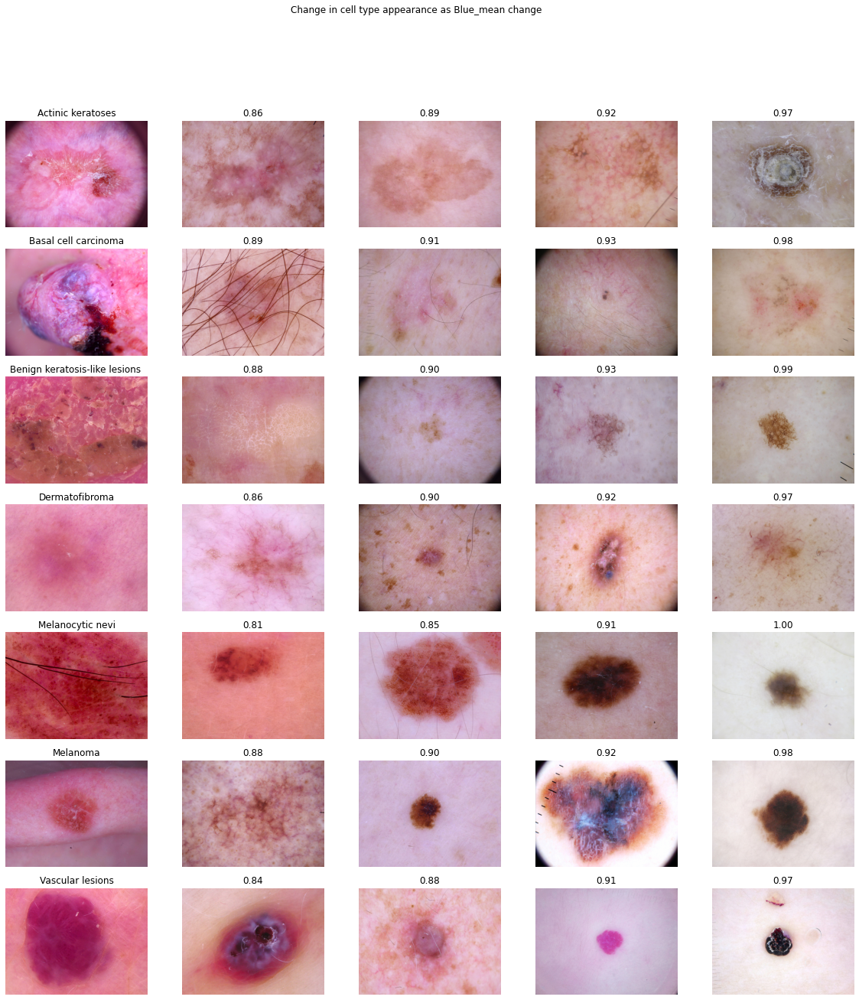

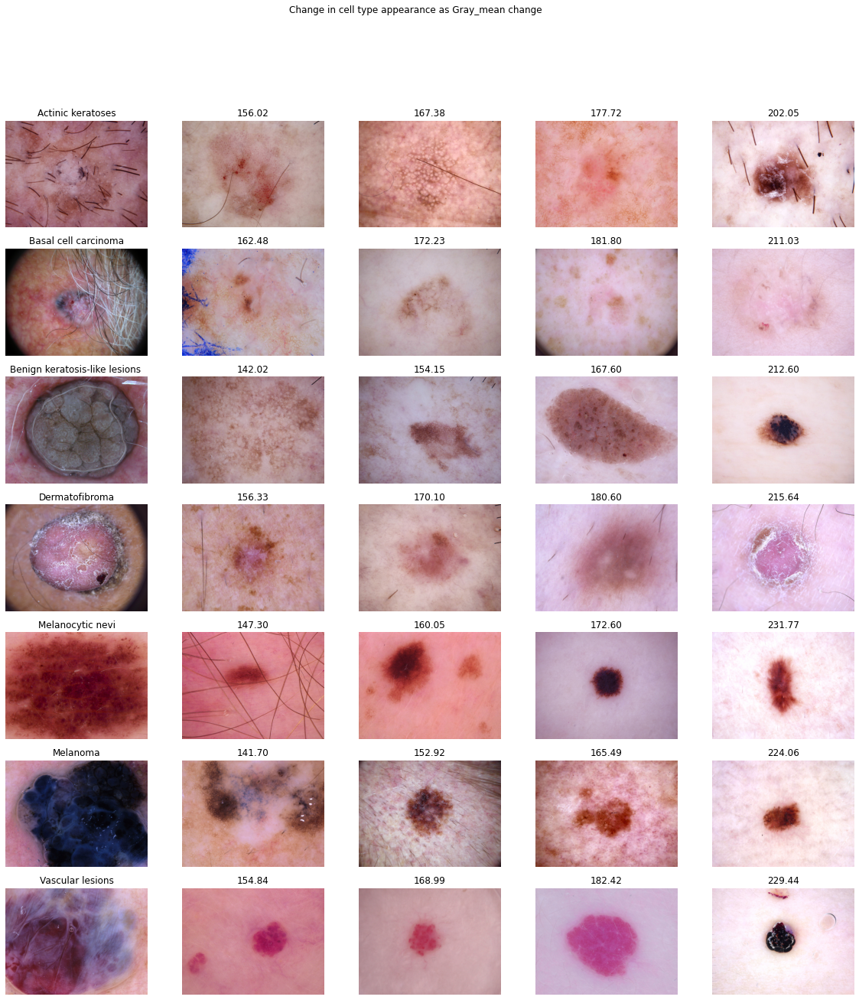

In [17]:
n_samples = 5
for sample_col in ["Red_mean", "Green_mean", "Blue_mean", "Gray_mean"]:
    fig, m_axs = plt.subplots(7, n_samples, figsize=(4 * n_samples, 3 * 7))
    fig.suptitle(f"Change in cell type appearance as {sample_col} change")
    # define a function to get back a dataframe with 5 samples sorted by color channel values 
    def take_n_space(in_rows, val_col, n):
        s_rows = in_rows.sort_values([val_col])
        s_idx = np.linspace(0, s_rows.shape[0] - 1, n, dtype=int)
        return s_rows.iloc[s_idx]
    
    for n_axs, (type_name, type_rows) in zip(m_axs, skin_df.sort_values(["cell_type"]).groupby("cell_type")):
        for c_ax, (_, c_row) in zip(n_axs, take_n_space(type_rows, sample_col, n_samples).iterrows()):
            c_ax.imshow(c_row["image"])
            c_ax.axis("off")
            c_ax.set_title('{:2.2f}'.format(c_row[sample_col]))
        n_axs[0].set_title(type_name)

In [18]:
from PIL import Image
reshaped_image = skin_df["path"].map(lambda x: np.asarray(Image.open(x).resize((64,64), resample=Image.LANCZOS).\
                                                          convert("RGB")).ravel())
out_vec = np.stack(reshaped_image, 0)
out_df = pd.DataFrame(out_vec)
out_df["label"] = skin_df["cell_type_idx"]
out_df.head()

,0,1,2,3,4,5,6,7,8,9,...,12279,12280,12281,12282,12283,12284,12285,12286,12287,label
0,191,152,194,191,153,195,192,149,192,194,...,185,154,180,186,156,184,182,152,173,2
1,24,13,23,24,14,28,37,24,46,61,...,26,15,29,27,15,28,24,13,25,2
2,185,129,140,192,136,151,198,142,156,198,...,152,120,138,144,113,123,115,81,84,2
3,24,11,19,36,19,30,64,38,50,91,...,27,13,16,25,12,16,24,9,14,2
4,138,94,117,158,113,138,178,133,161,191,...,140,106,118,108,77,92,67,40,55,2


In [19]:
out_path = "hmnist_64_64_RBG.csv"
out_df.to_csv(out_path, index=False)

In [20]:
img = Image.open(skin_df["path"][0])
img.size

(600, 450)

In [21]:
skin_df["cell_type"].unique()

array(['Benign keratosis-like lesions ', 'Melanocytic nevi',
       'Dermatofibroma', 'Melanoma', 'Vascular lesions',
       'Basal cell carcinoma', 'Actinic keratoses'], dtype=object)

In [22]:
for index in skin_df.index.values.tolist():
    path = skin_df.iloc[index]["path"]
    cell_type_idx = skin_df.iloc[index]["cell_type"]
    img_id = skin_df.iloc[index]["image_id"]
    newpath = f"OneDrive/Desktop/skin dataset/{cell_type_idx.strip()}/{img_id}.jpg"
    img = Image.open(path)
    img = img.resize((299, 299), resample=Image.LANCZOS)
    img.save(newpath)

FileNotFoundError: [Errno 2] No such file or directory: 'OneDrive/Desktop/skin dataset/Benign keratosis-like lesions/ISIC_0027419.jpg'

In [23]:
reshaped_image = skin_df["path"].map(lambda x: np.asarray(Image.open(x).resize((256,192), resample=Image.LANCZOS).\
                                                          convert("RGB")))
out_vec = np.stack(reshaped_image, 0)
out_vec.shape

(10015, 192, 256, 3)

In [25]:
out_vec = out_vec.astype("float32")
out_vec /= 255
labels = skin_df["cell_type_idx"].values
from sklearn.model_selection import train_test_split
X_train_orig, X_test, y_train_orig, y_test = train_test_split(out_vec, labels, test_size=0.1,random_state=0)
np.save("256_192_test.npy", X_test)
np.save("test_labels.npy", y_test)
X_train, X_val, y_train, y_val = train_test_split(X_train_orig, y_train_orig, test_size=0.1, random_state=1)
np.save("256_192_val.npy", X_val)
np.save("val_labels.npy", y_val)
np.save("256_192_train.npy", X_train)
np.save("train_labels.npy", y_train)

In [2]:
import os
from glob import glob

import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding

from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import Model
from keras.applications.inception_v3 import InceptionV3, preprocess_input
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras import backend as K

%matplotlib inline
import matplotlib.pyplot as plt
X_train = np.load("256_192_train.npy")
y_train = np.load("train_labels.npy")
X_val = np.load("256_192_val.npy")
y_val = np.load("val_labels.npy")
y_train = to_categorical(y_train)
y_val = to_categorical(y_val)


In [27]:
pre_trained_model = InceptionV3(input_shape=(192, 256, 3), include_top=False, weights="imagenet")
for layer in pre_trained_model.layers:
    print(layer.name)
    if hasattr(layer, 'moving_mean') and hasattr(layer, 'moving_variance'):
        layer.trainable = True
        K.eval(K.update(layer.moving_mean, K.zeros_like(layer.moving_mean)))
        K.eval(K.update(layer.moving_variance, K.zeros_like(layer.moving_variance)))
    else:
        layer.trainable = False

input_1
conv2d
batch_normalization
activation
conv2d_1
batch_normalization_1
activation_1
conv2d_2
batch_normalization_2
activation_2
max_pooling2d
conv2d_3
batch_normalization_3
activation_3
conv2d_4
batch_normalization_4
activation_4
max_pooling2d_1
conv2d_8
batch_normalization_8
activation_8
conv2d_6
conv2d_9
batch_normalization_6
batch_normalization_9
activation_6
activation_9
average_pooling2d
conv2d_5
conv2d_7
conv2d_10
conv2d_11
batch_normalization_5
batch_normalization_7
batch_normalization_10
batch_normalization_11
activation_5
activation_7
activation_10
activation_11
mixed0
conv2d_15
batch_normalization_15
activation_15
conv2d_13
conv2d_16
batch_normalization_13
batch_normalization_16
activation_13
activation_16
average_pooling2d_1
conv2d_12
conv2d_14
conv2d_17
conv2d_18
batch_normalization_12
batch_normalization_14
batch_normalization_17
batch_normalization_18
activation_12
activation_14
activation_17
activation_18
mixed1
conv2d_22
batch_normalization_22
activation_22
conv2d

In [28]:
last_layer = pre_trained_model.get_layer('mixed10')
print('last layer output shape:', last_layer.output_shape)
last_output = last_layer.output

last layer output shape: (None, 4, 6, 2048)


In [29]:
# Flatten the output layer to 1 dimension
x = layers.GlobalMaxPooling2D()(last_output)
# Add a fully connected layer with 512 hidden units and ReLU activation
x = layers.Dense(512, activation='relu')(x)
# Add a dropout rate of 0.5
x = layers.Dropout(0.5)(x)
# Add a final sigmoid layer for classification
x = layers.Dense(7, activation='softmax')(x)

# Configure and compile the model

model = Model(pre_trained_model.input, x)
optimizer = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=True)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 192, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 95, 127, 32)  864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 95, 127, 32)  96         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                              

C:\Users\chama\anaconda3\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:117: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


                                                                                                  
 activation_3 (Activation)      (None, 46, 62, 80)   0           ['batch_normalization_3[0][0]']  
                                                                                                  
 conv2d_4 (Conv2D)              (None, 44, 60, 192)  138240      ['activation_3[0][0]']           
                                                                                                  
 batch_normalization_4 (BatchNo  (None, 44, 60, 192)  576        ['conv2d_4[0][0]']               
 rmalization)                                                                                     
                                                                                                  
 activation_4 (Activation)      (None, 44, 60, 192)  0           ['batch_normalization_4[0][0]']  
                                                                                                  
 max_pooli

 batch_normalization_16 (BatchN  (None, 21, 29, 96)  288         ['conv2d_16[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_13 (Activation)     (None, 21, 29, 48)   0           ['batch_normalization_13[0][0]'] 
                                                                                                  
 activation_16 (Activation)     (None, 21, 29, 96)   0           ['batch_normalization_16[0][0]'] 
                                                                                                  
 average_pooling2d_1 (AveragePo  (None, 21, 29, 256)  0          ['mixed0[0][0]']                 
 oling2D)                                                                                         
                                                                                                  
 conv2d_12

                                                                                                  
 batch_normalization_25 (BatchN  (None, 21, 29, 64)  192         ['conv2d_25[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_19 (Activation)     (None, 21, 29, 64)   0           ['batch_normalization_19[0][0]'] 
                                                                                                  
 activation_21 (Activation)     (None, 21, 29, 64)   0           ['batch_normalization_21[0][0]'] 
                                                                                                  
 activation_24 (Activation)     (None, 21, 29, 96)   0           ['batch_normalization_24[0][0]'] 
                                                                                                  
 activatio

 batch_normalization_32 (BatchN  (None, 10, 14, 128)  384        ['conv2d_32[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_37 (BatchN  (None, 10, 14, 128)  384        ['conv2d_37[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_32 (Activation)     (None, 10, 14, 128)  0           ['batch_normalization_32[0][0]'] 
                                                                                                  
 activation_37 (Activation)     (None, 10, 14, 128)  0           ['batch_normalization_37[0][0]'] 
                                                                                                  
 average_p

                                                                                                  
 activation_42 (Activation)     (None, 10, 14, 160)  0           ['batch_normalization_42[0][0]'] 
                                                                                                  
 activation_47 (Activation)     (None, 10, 14, 160)  0           ['batch_normalization_47[0][0]'] 
                                                                                                  
 average_pooling2d_4 (AveragePo  (None, 10, 14, 768)  0          ['mixed4[0][0]']                 
 oling2D)                                                                                         
                                                                                                  
 conv2d_40 (Conv2D)             (None, 10, 14, 192)  147456      ['mixed4[0][0]']                 
                                                                                                  
 conv2d_43

 average_pooling2d_5 (AveragePo  (None, 10, 14, 768)  0          ['mixed5[0][0]']                 
 oling2D)                                                                                         
                                                                                                  
 conv2d_50 (Conv2D)             (None, 10, 14, 192)  147456      ['mixed5[0][0]']                 
                                                                                                  
 conv2d_53 (Conv2D)             (None, 10, 14, 192)  215040      ['activation_52[0][0]']          
                                                                                                  
 conv2d_58 (Conv2D)             (None, 10, 14, 192)  215040      ['activation_57[0][0]']          
                                                                                                  
 conv2d_59 (Conv2D)             (None, 10, 14, 192)  147456      ['average_pooling2d_5[0][0]']    
          

 conv2d_63 (Conv2D)             (None, 10, 14, 192)  258048      ['activation_62[0][0]']          
                                                                                                  
 conv2d_68 (Conv2D)             (None, 10, 14, 192)  258048      ['activation_67[0][0]']          
                                                                                                  
 conv2d_69 (Conv2D)             (None, 10, 14, 192)  147456      ['average_pooling2d_6[0][0]']    
                                                                                                  
 batch_normalization_60 (BatchN  (None, 10, 14, 192)  576        ['conv2d_60[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_63 (BatchN  (None, 10, 14, 192)  576        ['conv2d_63[0][0]']              
 ormalizat

                                                                                                  
 activation_80 (Activation)     (None, 4, 6, 448)    0           ['batch_normalization_80[0][0]'] 
                                                                                                  
 conv2d_77 (Conv2D)             (None, 4, 6, 384)    491520      ['mixed8[0][0]']                 
                                                                                                  
 conv2d_81 (Conv2D)             (None, 4, 6, 384)    1548288     ['activation_80[0][0]']          
                                                                                                  
 batch_normalization_77 (BatchN  (None, 4, 6, 384)   1152        ['conv2d_77[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_86 (BatchN  (None, 4, 6, 384)   1152        ['conv2d_86[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_90 (BatchN  (None, 4, 6, 384)   1152        ['conv2d_90[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_86 (Activation)     (None, 4, 6, 384)    0           ['batch_normalization_86[0][0]'] 
                                                                                                  
 activation_90 (Activation)     (None, 4, 6, 384)    0           ['batch_normalization_90[0][0]'] 
          

In [31]:

train_datagen = ImageDataGenerator(rotation_range=60, width_shift_range=0.2, height_shift_range=0.2,
                                   shear_range=0.2, zoom_range=0.2, fill_mode='nearest')

train_datagen.fit(X_train)

val_datagen = ImageDataGenerator()
val_datagen.fit(X_val)
batch_size = 64
epochs = 3
history = model.fit_generator(train_datagen.flow(X_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = val_datagen.flow(X_val, y_val),
                              verbose = 1, steps_per_epoch=(X_train.shape[0] // batch_size), 
                              validation_steps=(X_val.shape[0] // batch_size))

C:\Users\chama\AppData\Local\Temp\ipykernel_8652\52171807.py:10: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_datagen.flow(X_train,y_train, batch_size=batch_size),


Epoch 1/3
126/126 [==============================] - 2612s 21s/step - loss: 1.7019 - accuracy: 0.5854 - val_loss: 1.6665 - val_accuracy: 0.6518
Epoch 2/3
126/126 [==============================] - 2523s 20s/step - loss: 1.1090 - accuracy: 0.6622 - val_loss: 1.1953 - val_accuracy: 0.6674
Epoch 3/3
126/126 [==============================] - 2496s 20s/step - loss: 1.0619 - accuracy: 0.6694 - val_loss: 1.0380 - val_accuracy: 0.6629


In [32]:
for layer in pre_trained_model.layers[249:]:
    layer.trainable = True
optimizer = Adam(lr=0.0001, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.0, amsgrad=False)
model.compile(loss='categorical_crossentropy',
              optimizer=optimizer,
              metrics=['acc'])
learning_rate_reduction = ReduceLROnPlateau(monitor='val_acc', patience=3, verbose=1, factor=0.5, 
                                            min_lr=0.000001, cooldown=2)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 192, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 95, 127, 32)  864         ['input_1[0][0]']                
                                                                                                  
 batch_normalization (BatchNorm  (None, 95, 127, 32)  96         ['conv2d[0][0]']                 
 alization)                                                                                       
                                                                                              

 batch_normalization_10 (BatchN  (None, 21, 29, 96)  288         ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_11 (BatchN  (None, 21, 29, 32)  96          ['conv2d_11[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_5 (Activation)      (None, 21, 29, 64)   0           ['batch_normalization_5[0][0]']  
                                                                                                  
 activation_7 (Activation)      (None, 21, 29, 64)   0           ['batch_normalization_7[0][0]']  
                                                                                                  
 activatio

 conv2d_20 (Conv2D)             (None, 21, 29, 48)   13824       ['mixed1[0][0]']                 
                                                                                                  
 conv2d_23 (Conv2D)             (None, 21, 29, 96)   55296       ['activation_22[0][0]']          
                                                                                                  
 batch_normalization_20 (BatchN  (None, 21, 29, 48)  144         ['conv2d_20[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_23 (BatchN  (None, 21, 29, 96)  288         ['conv2d_23[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

                                                                                                  
 conv2d_34 (Conv2D)             (None, 10, 14, 128)  98304       ['mixed3[0][0]']                 
                                                                                                  
 batch_normalization_34 (BatchN  (None, 10, 14, 128)  384        ['conv2d_34[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_34 (Activation)     (None, 10, 14, 128)  0           ['batch_normalization_34[0][0]'] 
                                                                                                  
 conv2d_35 (Conv2D)             (None, 10, 14, 128)  114688      ['activation_34[0][0]']          
                                                                                                  
 batch_nor

                                                                                                  
 activation_44 (Activation)     (None, 10, 14, 160)  0           ['batch_normalization_44[0][0]'] 
                                                                                                  
 conv2d_45 (Conv2D)             (None, 10, 14, 160)  179200      ['activation_44[0][0]']          
                                                                                                  
 batch_normalization_45 (BatchN  (None, 10, 14, 160)  480        ['conv2d_45[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_45 (Activation)     (None, 10, 14, 160)  0           ['batch_normalization_45[0][0]'] 
                                                                                                  
 conv2d_41

 batch_normalization_55 (BatchN  (None, 10, 14, 160)  480        ['conv2d_55[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_55 (Activation)     (None, 10, 14, 160)  0           ['batch_normalization_55[0][0]'] 
                                                                                                  
 conv2d_51 (Conv2D)             (None, 10, 14, 160)  122880      ['mixed5[0][0]']                 
                                                                                                  
 conv2d_56 (Conv2D)             (None, 10, 14, 160)  179200      ['activation_55[0][0]']          
                                                                                                  
 batch_normalization_51 (BatchN  (None, 10, 14, 160)  480        ['conv2d_51[0][0]']              
 ormalizat

 conv2d_61 (Conv2D)             (None, 10, 14, 192)  147456      ['mixed6[0][0]']                 
                                                                                                  
 conv2d_66 (Conv2D)             (None, 10, 14, 192)  258048      ['activation_65[0][0]']          
                                                                                                  
 batch_normalization_61 (BatchN  (None, 10, 14, 192)  576        ['conv2d_61[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_66 (BatchN  (None, 10, 14, 192)  576        ['conv2d_66[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activatio

 ormalization)                                                                                    
                                                                                                  
 batch_normalization_74 (BatchN  (None, 10, 14, 192)  576        ['conv2d_74[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_70 (Activation)     (None, 10, 14, 192)  0           ['batch_normalization_70[0][0]'] 
                                                                                                  
 activation_74 (Activation)     (None, 10, 14, 192)  0           ['batch_normalization_74[0][0]'] 
                                                                                                  
 conv2d_71 (Conv2D)             (None, 4, 6, 320)    552960      ['activation_70[0][0]']          
          

                                                                                                  
 activation_82 (Activation)     (None, 4, 6, 384)    0           ['batch_normalization_82[0][0]'] 
                                                                                                  
 activation_83 (Activation)     (None, 4, 6, 384)    0           ['batch_normalization_83[0][0]'] 
                                                                                                  
 batch_normalization_84 (BatchN  (None, 4, 6, 192)   576         ['conv2d_84[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 activation_76 (Activation)     (None, 4, 6, 320)    0           ['batch_normalization_76[0][0]'] 
                                                                                                  
 mixed9_0 

 ormalization)                                                                                    
                                                                                                  
 activation_85 (Activation)     (None, 4, 6, 320)    0           ['batch_normalization_85[0][0]'] 
                                                                                                  
 mixed9_1 (Concatenate)         (None, 4, 6, 768)    0           ['activation_87[0][0]',          
                                                                  'activation_88[0][0]']          
                                                                                                  
 concatenate_1 (Concatenate)    (None, 4, 6, 768)    0           ['activation_91[0][0]',          
                                                                  'activation_92[0][0]']          
                                                                                                  
 activatio

In [33]:
batch_size = 64
epochs = 35
history = model.fit_generator(train_datagen.flow(X_train,y_train, batch_size=batch_size),
                              epochs = epochs, validation_data = val_datagen.flow(X_val, y_val),
                              verbose = 1, steps_per_epoch=(X_train.shape[0] // batch_size),
                              validation_steps=(X_val.shape[0] // batch_size),
                              callbacks=[learning_rate_reduction])

C:\Users\chama\AppData\Local\Temp\ipykernel_8652\1245916579.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_datagen.flow(X_train,y_train, batch_size=batch_size),


Epoch 1/35
126/126 [==============================] - 2401s 19s/step - loss: 0.9239 - acc: 0.6927 - val_loss: 0.8749 - val_acc: 0.7188 - lr: 1.0000e-04
Epoch 2/35
126/126 [==============================] - 2476s 20s/step - loss: 0.8041 - acc: 0.7170 - val_loss: 0.8305 - val_acc: 0.7031 - lr: 1.0000e-04
Epoch 3/35
126/126 [==============================] - 2412s 19s/step - loss: 0.7399 - acc: 0.7337 - val_loss: 0.7081 - val_acc: 0.7567 - lr: 1.0000e-04
Epoch 4/35
126/126 [==============================] - 2670s 21s/step - loss: 0.6983 - acc: 0.7587 - val_loss: 0.7248 - val_acc: 0.7232 - lr: 1.0000e-04
Epoch 5/35
126/126 [==============================] - 3085s 24s/step - loss: 0.6530 - acc: 0.7633 - val_loss: 0.6863 - val_acc: 0.7589 - lr: 1.0000e-04
Epoch 6/35
126/126 [==============================] - 2277s 18s/step - loss: 0.6094 - acc: 0.7807 - val_loss: 0.7332 - val_acc: 0.7121 - lr: 1.0000e-04
Epoch 7/35
126/126 [==============================] - 2136s 17s/step - loss: 0.5987 - ac

In [ ]:
model.save("InceptionV3.h5")

In [3]:
from tensorflow import keras
import numpy as np
model = keras.models.load_model('InceptionV3.h5')

In [4]:
loss_val, acc_val = model.evaluate(X_val, y_val, verbose=1)
print("Validation: accuracy = %f  ;  loss_v = %f" % (acc_val, loss_val))
y_test = to_categorical(y_test)
loss_test, acc_test = model.evaluate(X_test, y_test, verbose=1)
print("Test: accuracy = %f  ;  loss = %f" % (acc_test, loss_test))

29/29 [==============================] - 115s 4s/step - loss: 0.6472 - acc: 0.8093
Validation: accuracy = 0.809313  ;  loss_v = 0.647172


NameError: name 'y_test' is not defined

In [5]:
X_test = np.load("256_192_test.npy")
y_test = np.load("test_labels.npy")
y_test = to_categorical(y_test)
loss_test, acc_test = model.evaluate(X_test, y_test, verbose=1)
print("Test: accuracy = %f  ;  loss = %f" % (acc_test, loss_test))

32/32 [==============================] - 109s 3s/step - loss: 0.7321 - acc: 0.8044
Test: accuracy = 0.804391  ;  loss = 0.732070
